In [9]:
# '''
#  * @File: EDA.ipynb
#  * @Author: Derick.Zhengkun Du
#  * @Date: 4/19/23 5:00 PM
#  * @Last Modified by:   Derick.Zhengkun Du
#  * @Last Modified time: 4/19/23 5:00 PM
# '''


In [17]:
# !pip install bamboolib
# !pip install ipywidgets

zsh:1: command not found: pip
zsh:1: command not found: pip


In [1]:
import numpy as np
import bamboolib as bam
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel('BS_AllCompanies_Overview_March2023update.xlsx', 
                   sheet_name=['DIRECTOR_COREMETRICS','COMPANY_COREMETRICS','DIRECTOR_COMPANY_COREMETRICS'])

In [3]:
df_drct = df.get('DIRECTOR_COREMETRICS')
df_com = df.get('COMPANY_COREMETRICS')
df_dc = df.get('DIRECTOR_COMPANY_COREMETRICS')

In [280]:
# describe these 3 data
print(df_drct.describe())


        DIRECTOR: ID  DIRECTOR: AGE  DIRECTOR: DIVERSITY  \
count   72958.000000   65266.000000                  0.0   
mean   502060.689506      59.291377                  NaN   
std    217732.831191       9.738864                  NaN   
min     10027.000000      21.000000                  NaN   
25%    237021.750000      53.000000                  NaN   
50%    597910.500000      59.000000                  NaN   
75%    666856.750000      66.000000                  NaN   
max    727365.000000     104.000000                  NaN   

       DIRECTOR: ACTIVE BOARDS  DIRECTOR: BOARD HISTORY  \
count             72958.000000             72958.000000   
mean                  1.192796                 1.286644   
std                   0.526295                 0.683810   
min                   1.000000                 1.000000   
25%                   1.000000                 1.000000   
50%                   1.000000                 1.000000   
75%                   1.000000                

In [281]:
print(df_com.describe())


       COMPANY: CUSIP  COMPANY: LEAGUE  COMPANY: ACTIVE DIRECTORS  \
count             0.0      9558.000000                9558.000000   
mean              NaN         1.670956                   9.108286   
std               NaN         0.754198                   2.798992   
min               NaN         1.000000                   3.000000   
25%               NaN         1.000000                   7.000000   
50%               NaN         2.000000                   9.000000   
75%               NaN         2.000000                  11.000000   
max               NaN         4.000000                  29.000000   

       COMPANY: ALL DIRECTORS  WHO: AVERAGE AGE  WHO: % WOMEN  \
count             9558.000000       9074.000000   9470.000000   
mean                12.244507         59.382632     23.392397   
std                  4.431398          5.493877     14.657219   
min                  3.000000         32.000000      0.000000   
25%                  9.000000         56.000000     1

In [282]:
print(df_dc.describe())



        DIRECTOR: ID  DIRECTOR: AGE  DIRECTOR: DIVERSITY  \
count   86772.000000   78599.000000                  0.0   
mean   478336.500622      59.691955                  NaN   
std    226087.153906       9.544452                  NaN   
min     10027.000000      21.000000                  NaN   
25%    220478.000000      54.000000                  NaN   
50%    582031.000000      60.000000                  NaN   
75%    657504.250000      66.000000                  NaN   
max    727365.000000     104.000000                  NaN   

       DIRECTOR: ACTIVE BOARDS  DIRECTOR: BOARD HISTORY  COMPANY: CUSIP  \
count             86772.000000             86772.000000             0.0   
mean                  1.425310                 1.549486             NaN   
std                   0.795301                 0.971494             NaN   
min                   1.000000                 1.000000             NaN   
25%                   1.000000                 1.000000             NaN   
50%      

In [124]:
# join the df_drct, df_com and df_dc on director_id and on company_id
df_drct_dc = df_drct.merge(df_dc, how='left', on='DIRECTOR: ID')
df_drct_dc_com = df_drct_dc.merge(df_com, how='left', on='COMPANY: NAME')


In [ ]:
df_drct_dc_com.columns

In [161]:
df_drct_dc_com.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 86971 entries, 0 to 86970
Data columns (total 90 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   DIRECTOR: ID                                          86971 non-null  int64  
 1   DIRECTOR: NAME_x                                      86971 non-null  object 
 2   DIRECTOR: AGE_x                                       78768 non-null  float64
 3   DIRECTOR: GENDER_x                                    86903 non-null  object 
 4   DIRECTOR: ACTIVE BOARDS_x                             86971 non-null  int64  
 5   DIRECTOR: BOARD HISTORY_x                             86971 non-null  int64  
 6   RESUME: SMARTS                                        86188 non-null  object 
 7   RESUME: EXPERIENCE                                    86188 non-null  object 
 8   RESUME: AVERAGE BOARD CONNECTS                        86

In [16]:
df_drct.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72958 entries, 0 to 72957
Data columns (total 23 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   DIRECTOR: ID                            72958 non-null  int64  
 1   DIRECTOR: NAME                          72958 non-null  object 
 2   DIRECTOR: AGE                           65266 non-null  float64
 3   DIRECTOR: GENDER                        72891 non-null  object 
 4   DIRECTOR: DIVERSITY                     0 non-null      float64
 5   DIRECTOR: ACTIVE BOARDS                 72958 non-null  int64  
 6   DIRECTOR: BOARD HISTORY                 72958 non-null  int64  
 7   RESUME: SMARTS                          72337 non-null  object 
 8   RESUME: EXPERIENCE                      72337 non-null  object 
 9   RESUME: AVERAGE BOARD CONNECTS          72454 non-null  float64
 10  RESUME: NETWORK POWER                   72958 non-null  fl

In [13]:
df_com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9558 entries, 0 to 9557
Data columns (total 41 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   COMPANY: NAME                                         9558 non-null   object 
 1   COMPANY: TICKER                                       9465 non-null   object 
 2   COMPANY: CUSIP                                        0 non-null      float64
 3   COMPANY: DOMICILE                                     9558 non-null   object 
 4   COMPANY: SECTOR                                       9493 non-null   object 
 5   COMPANY: LEAGUE                                       9558 non-null   int64  
 6   COMPANY: ACTIVE DIRECTORS                             9558 non-null   int64  
 7   COMPANY: ALL DIRECTORS                                9558 non-null   int64  
 8   WHO: AVERAGE AGE                                      9074

In [84]:
df_dc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86772 entries, 0 to 86771
Data columns (total 35 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   DIRECTOR: ID                            86772 non-null  int64  
 1   DIRECTOR: NAME                          86772 non-null  object 
 2   DIRECTOR: AGE                           78599 non-null  float64
 3   DIRECTOR: GENDER                        86704 non-null  object 
 4   DIRECTOR: DIVERSITY                     0 non-null      float64
 5   DIRECTOR: ACTIVE BOARDS                 86772 non-null  int64  
 6   DIRECTOR: BOARD HISTORY                 86772 non-null  int64  
 7   COMPANY: NAME                           86772 non-null  object 
 8   COMPANY: TICKER                         86709 non-null  object 
 9   COMPANY: CUSIP                          0 non-null      float64
 10  COMPANY: DOMICILE                       86772 non-null  ob

In [174]:
print(df_drct_dc_com.head())

   DIRECTOR: ID DIRECTOR: NAME_x  DIRECTOR: AGE_x DIRECTOR: GENDER_x  \
0         27891     Ronald Sugar             74.0                  1   
1         27891     Ronald Sugar             74.0                  1   
2         27891     Ronald Sugar             74.0                  1   
3         27891     Ronald Sugar             74.0                  1   
4         30747    Robert Eckert             67.0                  1   

   DIRECTOR: ACTIVE BOARDS_x  DIRECTOR: BOARD HISTORY_x  RESUME: SMARTS  \
0                          4                          5             1.0   
1                          4                          5             1.0   
2                          4                          5             1.0   
3                          4                          5             1.0   
4                          4                          4             1.0   

  RESUME: EXPERIENCE  RESUME: AVERAGE BOARD CONNECTS  RESUME: NETWORK POWER  \
0                Yes                 

In [125]:
# transfer the data "Yes" and "No" to 1 and 0 of the columns whose name starting with "INFLUENCE DRIVER:"
df_drct_dc_com.iloc[:, 44:52] = df_drct_dc_com.iloc[:, 44:52].replace({'Yes': 1, 'No': 0})
df_drct_dc_com.iloc[:, 6:8] = df_drct_dc_com.iloc[:, 6:8].replace({'Yes': 1, 'No': 0})

DF.iloc[:, 3] = DF.iloc[:, 3].replace({'Male': 1, 'Female': 0})
df_drct_dc_com.iloc[:, 24] = df_drct_dc_com.iloc[:, 24].replace({'Male': 1, 'Female': 0})


In [126]:
# replace the data with "Unrated" to null of columns whose name starting with "PERFORMANCE:"
df_drct_dc_com.iloc[:, 52:57] = df_drct_dc_com.iloc[:, 52:57].replace({'Unrated': np.nan})
df_drct_dc_com.iloc[:, 17:23] = df_drct_dc_com.iloc[:, 17:23].replace({'Unrated': np.nan})

In [127]:
# remove the columns with all null values
df_drct_dc_com = df_drct_dc_com.dropna(axis=1, how='all')

In [9]:
sns.boxplot(x=df['PERFORMANCE: EBITDA WIN RATE_x'])

KeyError: 'PERFORMANCE: EBITDA WIN RATE_x'

In [57]:
# transfer the df_dc data type of all columns to numeric except for the top 14 columns
# df_dc.iloc[:,14:] = df_dc.iloc[:,14:].apply(pd.to_numeric, errors='coerce')
# df_dc = df_dc.apply(pd.to_numeric, errors='coerce')


In [106]:
fig = px.scatter(df_dc, x='DIRECTOR: AGE', y='PERFORMANCE: EBITDA WIN RATE')

# Add title and axis labels
fig.update_layout(title='Age vs. EBITDA Win Rate',
                  xaxis_title='Age of Board Members',
                  yaxis_title='EBITDA Win Rate')

# Show the plot
fig.show()

In [107]:
# Visualizing distribution of director's age
age_hist = px.histogram(df_dc, x='DIRECTOR: AGE', nbins=30, title="Distribution of Director's Age", labels={'value':'Age'}, color_discrete_sequence=['#A2D5F2'], opacity=0.8, template='plotly_white', marginal='box')
age_hist.show()

In [284]:
# summarize the distribution of director's age
print(df_dc['DIRECTOR: AGE'].describe())

count    78599.000000
mean        59.691955
std          9.544452
min         21.000000
25%         54.000000
50%         60.000000
75%         66.000000
max        104.000000
Name: DIRECTOR: AGE, dtype: float64


In [108]:
# Visualizing percentage of directors by gender
gender_pie = px.pie(df_dc, names='DIRECTOR: GENDER', title='Percentage of Directors by Gender')
gender_pie.show()

In [ ]:
# summarize the distribution of gender of directors



In [109]:
# Visualizing number of active boards for directors
active_boards_hist = px.histogram(df_dc, x='DIRECTOR: ACTIVE BOARDS', nbins=30, title="Distribution of Active Boards for Directors")
active_boards_hist.show()


In [285]:
# summarize the distribution of active boards for directors
print(df_dc['DIRECTOR: ACTIVE BOARDS'].describe())


count    86772.000000
mean         1.425310
std          0.795301
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          8.000000
Name: DIRECTOR: ACTIVE BOARDS, dtype: float64


In [110]:

# Visualizing influence distribution of directors
influence_hist = px.histogram(df_com, x='INFLUENCERS: HIGHEST INFLUENCE %', nbins=30, title="Distribution of Influence for Directors")
influence_hist.show()


In [111]:

# Visualizing average board connections only showing directors with more than 1 board connection
# Only showing 20 directors with the most board connections by descending order
df_drct_filter = df_drct[df_drct['RESUME: AVERAGE BOARD CONNECTS'] > 1]
avg_board_connections = px.bar(df_drct_filter.sort_values(by='RESUME: AVERAGE BOARD CONNECTS', ascending=False).head(20),   x='DIRECTOR: NAME', y='RESUME: AVERAGE BOARD CONNECTS', title="Average Board Connections for Directors", color="DIRECTOR: NAME")
# df_drct_filter1 = df_drct[df_drct['RESUME: AVERAGE BOARD CONNECTS'] > 1]
# avg_board_connections = px.scatter(df_drct_filter1, x='DIRECTOR: NAME', y='RESUME: AVERAGE BOARD CONNECTS', title="Average Board Connections for Directors")
avg_board_connections.show()


In [289]:
# only choose RESUME: AVERAGE BOARD CONNECTS and DIRECTOR: NAME columns
df_drct_filter = df_drct_filter[[ 'DIRECTOR: NAME', 'RESUME: AVERAGE BOARD CONNECTS']]

In [290]:
print(df_drct_filter.sort_values(by='RESUME: AVERAGE BOARD CONNECTS', ascending=False).head(20))

              DIRECTOR: NAME  RESUME: AVERAGE BOARD CONNECTS
17412        Normand Legault                           100.0
138            Andrew Hunter                           100.0
124           Hong Tsung Lan                            81.0
192             Kai Ming Lai                            74.0
12250           Ping-Chih Wu                            70.0
14578              Bar?s Tan                            68.0
14762     Tugban Izzet Aksoy                            66.0
14760    Mehmet Hursit Zorlu                            66.0
9657             Axton Salim                            65.0
149           Sharon MacLeod                            60.0
14499             Ugur Bayar                            59.0
127              Sow-Mei Sng                            59.0
14498       Ahmet Boyacioglu                            59.0
27551         Jennifer Clark                            58.0
632            Antonio Arino                            58.0
140          Gregory Tre

In [112]:

# Visualizing performance categories of directors
performance_categories = px.histogram(df_drct, x='PERFORMANCE: CATEGORY', title='Performance Categories of Directors', color='PERFORMANCE: CATEGORY')
performance_categories.show()


In [115]:

# Visualizing average influence by gender

influence_gender = px.bar(df_drct, x='DIRECTOR: GENDER', y='PERFORMANCE: EBITDA WIN RATE', title='Influence by Gender', color_discrete_sequence=['#A2D5F2'])
influence_gender.show()


In [128]:
# only select the columns in numeric type of df_drct_dc_com
df_drct_dc_com_numeric = df_drct_dc_com.select_dtypes(include=['int64', 'float64'])

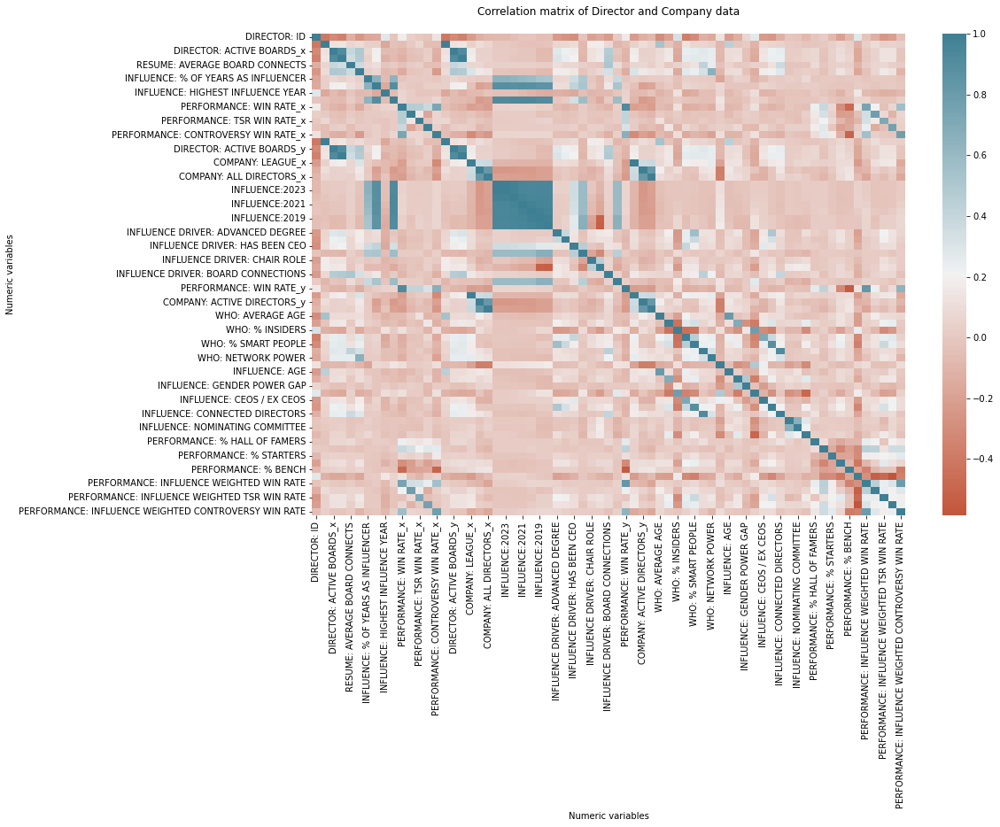

In [121]:
# visualization of correlation matrix for all variables in df_dc wihtout the number on the plot

fig, ax = plt.subplots(figsize=(15, 10))

corrplot = sns.heatmap(df_drct_dc_com_numeric.corr(),
cmap=sns.diverging_palette(20, 220, n=800))

corrplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Correlation matrix of Director and Company data\n")

plt.show()


In [ ]:
# summarize the corelation matrix of df_drct_dc_com_numeric
print(df_drct_dc_com_numeric.corr())

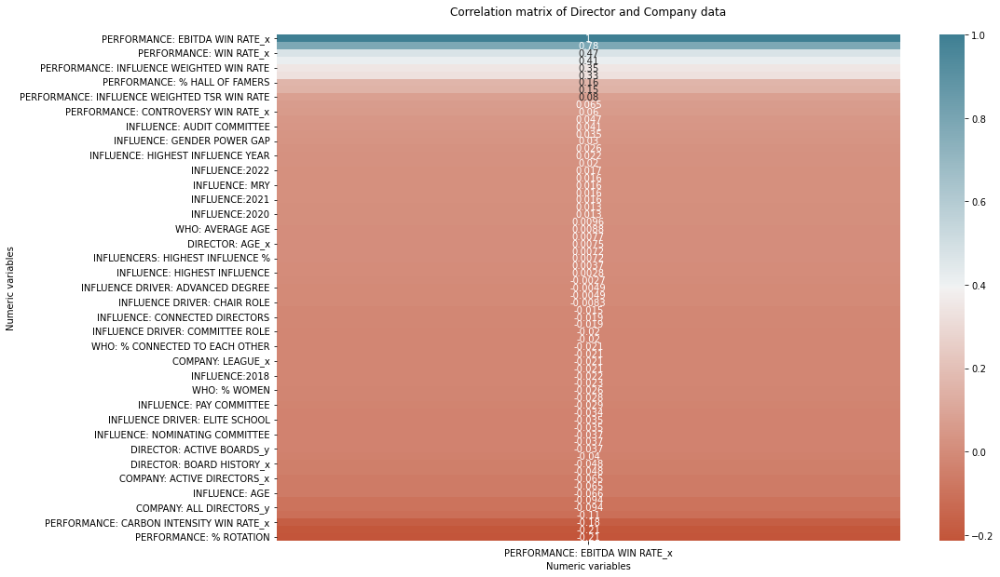

In [129]:
# Find the high correaltion variables with the PERFORMACE: EBITDA WIN RATE
df_drct_dc_com_corr = df_drct_dc_com.corr()
# print(df_drct_dc_com_corr.columns)
df_drct_dc_com_corr['PERFORMANCE: EBITDA WIN RATE_x'].sort_values(ascending=False)
# visualize df_drct_dc_com_corr with PERFORMACE: EBITDA WIN RATE
fig, ax = plt.subplots(figsize=(15, 10))

corrplot = sns.heatmap(df_drct_dc_com_corr[['PERFORMANCE: EBITDA WIN RATE_x']].sort_values(by='PERFORMANCE: EBITDA WIN RATE_x', ascending=False),
cmap=sns.diverging_palette(20, 220, n=800), annot=True)

corrplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Correlation matrix of Director and Company data\n")

plt.show()


# # visualize the correlation matrix of df_drct_dc_com with the number on the plot

# fig, ax = plt.subplots(figsize=(15, 10))

# corrplot = sns.heatmap(df_drct_dc_com_numeric.corr(),


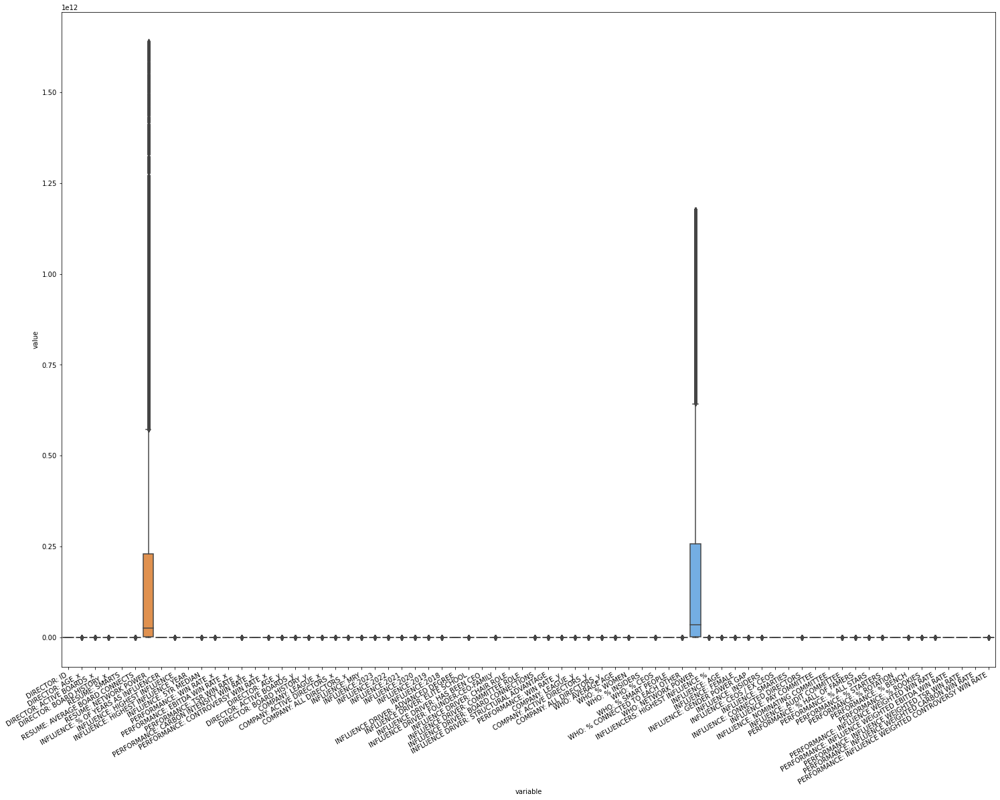

In [20]:
# select numeric columns of df_drct_dc_com to visualize the outliers
df_drct_dc_com_numeric = df_drct_dc_com.select_dtypes(include=['int64', 'float64'])

# visualize the outliers of df_drct_dc_com_numeric
# Select numeric variables to compute correlation


fig = plt.figure(figsize=(25,20))

sns.boxplot(x="variable", y="value", data=pd.melt(df_drct_dc_com_numeric))
plt.gcf().autofmt_xdate()
plt.show()
# boxplot = sns.boxplot(data=df_drct_dc_com_numeric, orient="h", palette="Set2")

# boxplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Outliers of Director and Company data\n")

# plt.show()


<AxesSubplot:xlabel='PERFORMANCE: EBITDA WIN RATE_x'>

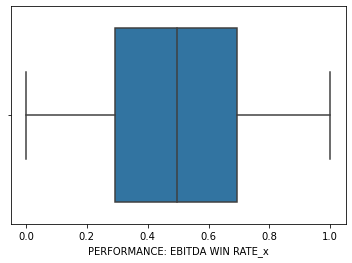

In [11]:
sns.boxplot(x=df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'])

In [129]:
outlier_col = ['RESUME: NETWORK POWER', 'WHO: NETWORK POWER']
for col in outlier_col:
    Q1 = df_drct_dc_com[col].quantile(0.25)
    Q3 = df_drct_dc_com[col].quantile(0.75)
    IQR = Q3 - Q1
  
    df_drct_dc_com.drop(df_drct_dc_com[df_drct_dc_com[col] >= (Q3+1.5*IQR)].index, axis=0, inplace = True)
    df_drct_dc_com.drop(df_drct_dc_com[df_drct_dc_com[col] <= (Q1-1.5*IQR)].index, axis=0, inplace = True)

df_drct_dc_com.reset_index(drop=True, inplace=True)

In [130]:
Q1 = df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'].quantile(0.25)
Q3 = df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'].quantile(0.75)
IQR = Q3 - Q1

filter = (df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'] >= Q1 - 1.5 * IQR) & (df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'] <= Q3 + 1.5 *IQR)
df_drct_dc_com = df_drct_dc_com.loc[filter]  


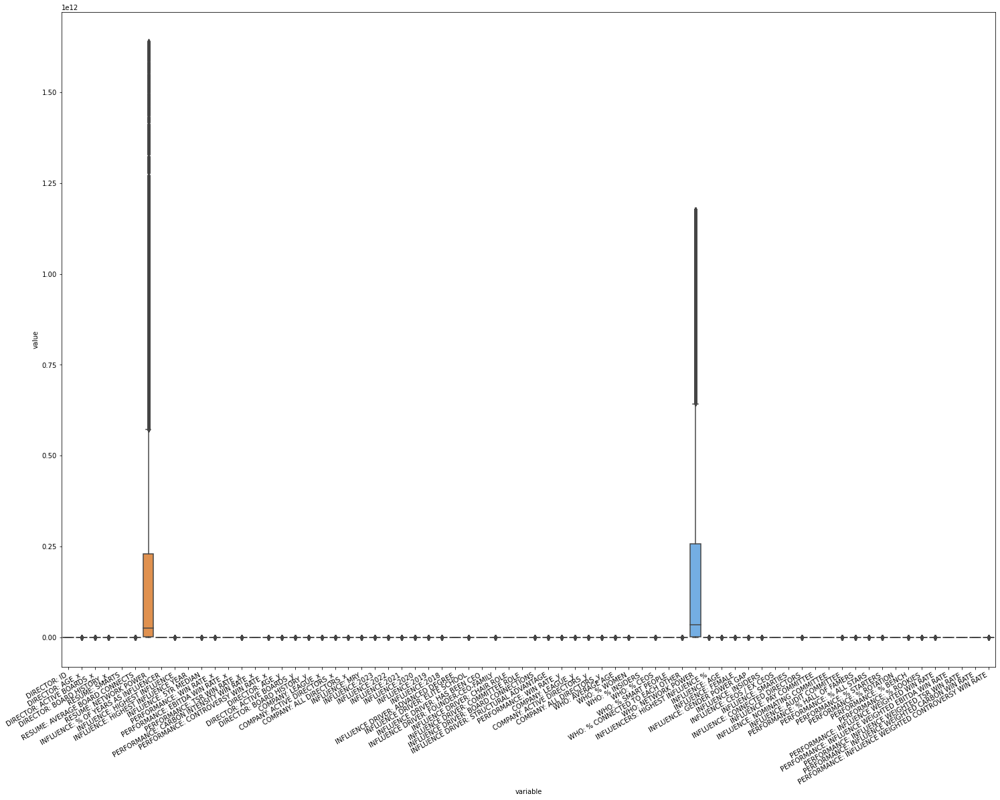

In [ ]:
# select numeric columns of df_drct_dc_com to visualize the outliers
df_drct_dc_com_numeric = df_drct_dc_com.select_dtypes(include=['int64', 'float64'])

# visualize the outliers of df_drct_dc_com_numeric
# Select numeric variables to compute correlation


fig = plt.figure(figsize=(25,20))

sns.boxplot(x="variable", y="value", data=pd.melt(df_drct_dc_com_numeric))
plt.gcf().autofmt_xdate()
plt.show()
# boxplot = sns.boxplot(data=df_drct_dc_com_numeric, orient="h", palette="Set2")

# boxplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Outliers of Director and Company data\n")

# plt.show()


<AxesSubplot:xlabel='PERFORMANCE: EBITDA WIN RATE_x'>

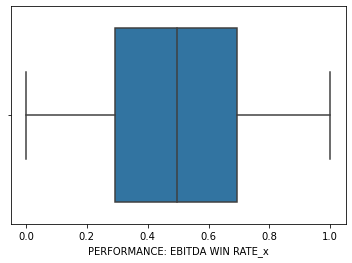

In [13]:
sns.boxplot(x=df_drct_dc_com['PERFORMANCE: EBITDA WIN RATE_x'])

In [131]:
# select the columns name starting with "PERFORMANCE:" of df_drct_dc_com
df_drct_dc_com_PERFORMANCE = df_drct_dc_com.filter(regex='PERFORMANCE:')
print(df_drct_dc_com_PERFORMANCE.columns)
columns_PERFORMANCE = df_drct_dc_com_PERFORMANCE.columns
# drop "PERFORMANCE: EBITDA WIN RATE_x" from the list of columns_PERFORMANCE
columns_PERFORMANCE = columns_PERFORMANCE.drop('PERFORMANCE: EBITDA WIN RATE_x')
print(columns_PERFORMANCE)
# drop the columns ('PERFORMANCE: CATEGORY', 'PERFORMANCE: EBITDA WIN RATE_y', 'PERFORMANCE: TSR WIN RATE_y', 'PERFORMANCE: CARBON INTENSITY WIN RATE_y', 'PERFORMANCE: CONTROVERSY WIN RATE_y') from columns_PERFORMANCE
columns_PERFORMANCE = columns_PERFORMANCE.drop(['PERFORMANCE: CATEGORY', 'PERFORMANCE: EBITDA WIN RATE_y', 'PERFORMANCE: TSR WIN RATE_y', 'PERFORMANCE: CARBON INTENSITY WIN RATE_y', 'PERFORMANCE: CONTROVERSY WIN RATE_y'])
print(columns_PERFORMANCE)


Index(['PERFORMANCE: CATEGORY', 'PERFORMANCE: WIN RATE_x',
       'PERFORMANCE: EBITDA WIN RATE_x', 'PERFORMANCE: TSR WIN RATE_x',
       'PERFORMANCE: CARBON INTENSITY WIN RATE_x',
       'PERFORMANCE: CONTROVERSY WIN RATE_x', 'PERFORMANCE: WIN RATE_y',
       'PERFORMANCE: EBITDA WIN RATE_y', 'PERFORMANCE: TSR WIN RATE_y',
       'PERFORMANCE: CARBON INTENSITY WIN RATE_y',
       'PERFORMANCE: CONTROVERSY WIN RATE_y', 'PERFORMANCE: % HALL OF FAMERS',
       'PERFORMANCE: % ALL STARS', 'PERFORMANCE: % STARTERS',
       'PERFORMANCE: % ROTATION', 'PERFORMANCE: % BENCH',
       'PERFORMANCE: % ROOKIES', 'PERFORMANCE: INFLUENCE WEIGHTED WIN RATE',
       'PERFORMANCE: INFLUENCE WEIGHTED EBITDA WIN RATE',
       'PERFORMANCE: INFLUENCE WEIGHTED TSR WIN RATE',
       'PERFORMANCE: INFLUENCE WEIGHTED CARBON WIN RATE',
       'PERFORMANCE: INFLUENCE WEIGHTED CONTROVERSY WIN RATE'],
      dtype='object')
Index(['PERFORMANCE: CATEGORY', 'PERFORMANCE: WIN RATE_x',
       'PERFORMANCE: TSR WIN R

In [149]:
# select the columns without type of numeric of df_drct_dc_com
# df_drct_dc_com_non_numeric = df_drct_dc_com.select_dtypes(exclude=['int64', 'float64'])
# numericColumns = df_drct_dc_com_non_numeric.columns

In [176]:
# append DIRECTOR: NAME, COMPANY: NAME, COMPANY: TICKER, DIRECTOR: ID to the list of columns_PERFORMANCE
# columns_PERFORMANCE = columns_PERFORMANCE.append(pd.Index(['DIRECTOR: NAME_x', 'COMPANY: NAME', 'COMPANY: TICKER_x', 'DIRECTOR: ID','DIRECTOR: NAME_y']))
# # only choose the columns of df_drct_dc_com whose name not in columns_PERFORMANCE
# df_drct_dc_com_corr1 = df_drct_dc_com.drop(columns=columns_PERFORMANCE)
# # df_drct_dc_com_corr1 = df_drct_dc_com_corr1.drop(columns=numericColumns)
# print(df_drct_dc_com_corr1.columns)


Index(['DIRECTOR: AGE_x', 'DIRECTOR: GENDER_x', 'DIRECTOR: ACTIVE BOARDS_x',
       'DIRECTOR: BOARD HISTORY_x', 'RESUME: SMARTS', 'RESUME: EXPERIENCE',
       'RESUME: AVERAGE BOARD CONNECTS', 'RESUME: NETWORK POWER',
       'INFLUENCE: INFLUENCER?', 'INFLUENCE: % OF YEARS AS INFLUENCER',
       'INFLUENCE: HIGHEST INFLUENCE AT…', 'INFLUENCE: HIGHEST INFLUENCE',
       'INFLUENCE: HIGHEST INFLUENCE YEAR', 'INFLUENCE: 5YR MEDIAN',
       'PERFORMANCE: EBITDA WIN RATE_x', 'DIRECTOR: AGE_y',
       'DIRECTOR: GENDER_y', 'DIRECTOR: ACTIVE BOARDS_y',
       'DIRECTOR: BOARD HISTORY_y', 'COMPANY: DOMICILE_x', 'COMPANY: SECTOR_x',
       'COMPANY: LEAGUE_x', 'COMPANY: ACTIVE DIRECTORS_x',
       'COMPANY: ALL DIRECTORS_x', 'INFLUENCE: MRY', 'INFLUENCE:2023',
       'INFLUENCE:2022', 'INFLUENCE:2021', 'INFLUENCE:2020', 'INFLUENCE:2019',
       'INFLUENCE:2018', 'INFLUENCE DRIVER: ADVANCED DEGREE',
       'INFLUENCE DRIVER: ELITE SCHOOL', 'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRI

In [132]:
# drop the columns of df_drct_dc_com whose name in columns_PERFORMANCE
df_drct_dc_com_numeric = df_drct_dc_com_numeric.drop(columns=columns_PERFORMANCE)
print(df_drct_dc_com_numeric.columns)

Index(['DIRECTOR: ID', 'DIRECTOR: AGE_x', 'DIRECTOR: ACTIVE BOARDS_x',
       'DIRECTOR: BOARD HISTORY_x', 'RESUME: SMARTS',
       'RESUME: AVERAGE BOARD CONNECTS', 'RESUME: NETWORK POWER',
       'INFLUENCE: % OF YEARS AS INFLUENCER', 'INFLUENCE: HIGHEST INFLUENCE',
       'INFLUENCE: HIGHEST INFLUENCE YEAR', 'INFLUENCE: 5YR MEDIAN',
       'PERFORMANCE: EBITDA WIN RATE_x', 'DIRECTOR: AGE_y',
       'DIRECTOR: ACTIVE BOARDS_y', 'DIRECTOR: BOARD HISTORY_y',
       'COMPANY: LEAGUE_x', 'COMPANY: ACTIVE DIRECTORS_x',
       'COMPANY: ALL DIRECTORS_x', 'INFLUENCE: MRY', 'INFLUENCE:2023',
       'INFLUENCE:2022', 'INFLUENCE:2021', 'INFLUENCE:2020', 'INFLUENCE:2019',
       'INFLUENCE:2018', 'INFLUENCE DRIVER: ADVANCED DEGREE',
       'INFLUENCE DRIVER: ELITE SCHOOL', 'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRIVER: FOUNDER-CEO-FAMILY', 'INFLUENCE DRIVER: CHAIR ROLE',
       'INFLUENCE DRIVER: COMMITTEE ROLE',
       'INFLUENCE DRIVER: BOARD CONNECTIONS',
       'INFLUENCE DRIVE

In [133]:
# drop the rows with missing values and null values
df_drct_dc_com_numeric = df_drct_dc_com_numeric.dropna()

In [138]:
# normalize the data
df_drct_dc_com_numeric = (df_drct_dc_com_numeric - df_drct_dc_com_numeric.mean()) / df_drct_dc_com_numeric.std()
print(df_drct_dc_com_numeric.columns)


Index(['DIRECTOR: ID', 'DIRECTOR: AGE_x', 'DIRECTOR: ACTIVE BOARDS_x',
       'DIRECTOR: BOARD HISTORY_x', 'RESUME: SMARTS',
       'RESUME: AVERAGE BOARD CONNECTS', 'RESUME: NETWORK POWER',
       'INFLUENCE: % OF YEARS AS INFLUENCER', 'INFLUENCE: HIGHEST INFLUENCE',
       'INFLUENCE: HIGHEST INFLUENCE YEAR', 'INFLUENCE: 5YR MEDIAN',
       'PERFORMANCE: EBITDA WIN RATE_x', 'DIRECTOR: AGE_y',
       'DIRECTOR: ACTIVE BOARDS_y', 'DIRECTOR: BOARD HISTORY_y',
       'COMPANY: LEAGUE_x', 'COMPANY: ACTIVE DIRECTORS_x',
       'COMPANY: ALL DIRECTORS_x', 'INFLUENCE: MRY', 'INFLUENCE:2023',
       'INFLUENCE:2022', 'INFLUENCE:2021', 'INFLUENCE:2020', 'INFLUENCE:2019',
       'INFLUENCE:2018', 'INFLUENCE DRIVER: ADVANCED DEGREE',
       'INFLUENCE DRIVER: ELITE SCHOOL', 'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRIVER: FOUNDER-CEO-FAMILY', 'INFLUENCE DRIVER: CHAIR ROLE',
       'INFLUENCE DRIVER: COMMITTEE ROLE',
       'INFLUENCE DRIVER: BOARD CONNECTIONS',
       'INFLUENCE DRIVE

In [ ]:

# visualize the correlation matrix of df_drct_dc_com with the number on the plot

fig, ax = plt.subplots(figsize=(15, 10))

corrplot = sns.heatmap(df_drct_dc_com_numeric.corr(),
cmap=sns.diverging_palette(20, 220, n=800), annot=True)

corrplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Correlation matrix of Director and Company data\n")

plt.show()



In [134]:
# standardization by using standardScaler

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_drct_dc_com_numeric_scaled = scaler.fit_transform(df_drct_dc_com_numeric)
df_drct_dc_com_numeric_scaled = pd.DataFrame(df_drct_dc_com_numeric_scaled, columns=df_drct_dc_com_numeric.columns)
print(df_drct_dc_com_numeric_scaled.columns)


Index(['DIRECTOR: ID', 'DIRECTOR: AGE_x', 'DIRECTOR: ACTIVE BOARDS_x',
       'DIRECTOR: BOARD HISTORY_x', 'RESUME: SMARTS',
       'RESUME: AVERAGE BOARD CONNECTS', 'RESUME: NETWORK POWER',
       'INFLUENCE: % OF YEARS AS INFLUENCER', 'INFLUENCE: HIGHEST INFLUENCE',
       'INFLUENCE: HIGHEST INFLUENCE YEAR', 'INFLUENCE: 5YR MEDIAN',
       'PERFORMANCE: EBITDA WIN RATE_x', 'DIRECTOR: AGE_y',
       'DIRECTOR: ACTIVE BOARDS_y', 'DIRECTOR: BOARD HISTORY_y',
       'COMPANY: LEAGUE_x', 'COMPANY: ACTIVE DIRECTORS_x',
       'COMPANY: ALL DIRECTORS_x', 'INFLUENCE: MRY', 'INFLUENCE:2023',
       'INFLUENCE:2022', 'INFLUENCE:2021', 'INFLUENCE:2020', 'INFLUENCE:2019',
       'INFLUENCE:2018', 'INFLUENCE DRIVER: ADVANCED DEGREE',
       'INFLUENCE DRIVER: ELITE SCHOOL', 'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRIVER: FOUNDER-CEO-FAMILY', 'INFLUENCE DRIVER: CHAIR ROLE',
       'INFLUENCE DRIVER: COMMITTEE ROLE',
       'INFLUENCE DRIVER: BOARD CONNECTIONS',
       'INFLUENCE DRIVE

In [ ]:
# determine the imbalanced data
# from imblearn.over_sampling import SMOTE
# from collections import Counter

# # define the dataset
# X = df_drct_dc_com_numeric_scaled.drop(columns=['PERFORMANCE: EBITDA WIN RATE_x'])
# y = df_drct_dc_com_numeric_scaled['PERFORMANCE: EBITDA WIN RATE_x']
# # summarize class distribution
# print(Counter(y))
# # define oversampling strategy
# oversample = SMOTE()

# # fit and apply the transform
# X, y = oversample.fit_resample(X, y)
# # summarize class distribution
# print(Counter(y))




In [ ]:
# use smoote to deal with the imbalanced data
# from imblearn.over_sampling import SMOTE

# # define the smote model
# smote = SMOTE()

# # fit the smote model

# X_smote, y_smote = smote.fit_resample(df_drct_dc_com_numeric_scaled, df_drct_dc_com['PERFORMANCE: CATEGORY'])
# print(X_smote.shape, y_smote.shape)

# # visualize the distribution of the target variable
# sns.countplot(y_smote, palette='Set2')
# plt.show()


In [135]:
# choose X, y for the model
from sklearn.model_selection import train_test_split


X = df_drct_dc_com_numeric_scaled.drop(columns=['PERFORMANCE: EBITDA WIN RATE_x', 'INFLUENCE: MRY', 'INFLUENCE:2018','INFLUENCE:2019', 'INFLUENCE:2020', 'INFLUENCE:2021', 'INFLUENCE:2022', 'INFLUENCE:2023', 'DIRECTOR: ID' ])
y = df_drct_dc_com_numeric_scaled['PERFORMANCE: EBITDA WIN RATE_x']

# split train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


In [139]:
# fit linear regression model
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)

# predict y
y_pred = lr.predict(X_test)


In [140]:

# calculate the R^2
from sklearn.metrics import r2_score

r2_score(y_test, y_pred)


0.027767120550165503

In [29]:

# calculate the RMSE
from sklearn.metrics import mean_squared_error

mean_squared_error(y_test, y_pred, squared=False)


1.0142393931639089

In [241]:

# calculate the MAE

from sklearn.metrics import mean_absolute_error

mean_absolute_error(y_test, y_pred)


0.1813011531925724

In [242]:

# calculate the MAPE

def mean_absolute_percentage_error(y_test, y_pred):
    return np.mean(np.abs((y_test - y_pred) / y_test)) * 100

mean_absolute_percentage_error(y_test, y_pred)


inf

In [243]:

# calculate the MSE

from sklearn.metrics import mean_squared_error

mean_squared_error(y_test, y_pred)


0.048640831314348536

In [39]:
# view model summary
import statsmodels.api as sm

X_train_sm = sm.add_constant(X_train)
lr_sm = sm.OLS(y_train, X_train_sm)

lr_sm = lr_sm.fit()
lr_sm.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                  
==========================================================================================
Dep. Variable:     PERFORMANCE: EBITDA WIN RATE_x   R-squared:                       0.070
Model:                                        OLS   Adj. R-squared:                  0.060
Method:                             Least Squares   F-statistic:                     7.175
Date:                            Sat, 13 May 2023   Prob (F-statistic):           2.73e-38
Time:                                    16:04:44   Log-Likelihood:                -5439.8
No. Observations:                            3948   AIC:                         1.096e+04
Df Residuals:                                3906   BIC:                         1.123e+04
Df Model:                                      41                                         
Covariance Type:                        nonrobust                                         
==========================================================================================================
                                             coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
const                                     -0.0079      0.015     -0.515      0.607      -0.038       0.022
DIRECTOR: ID                              -0.0325      0.017     -1.890      0.059      -0.066       0.001
DIRECTOR: AGE_x                           -0.0922      0.402     -0.229      0.819      -0.880       0.696
DIRECTOR: ACTIVE BOARDS_x                 -0.0070      0.016     -0.424      0.672      -0.039       0.025
DIRECTOR: BOARD HISTORY_x                 -0.0173      0.017     -1.039      0.299      -0.050       0.015
RESUME: SMARTS                            -0.0245      0.046     -0.530      0.596      -0.115       0.066
RESUME: AVERAGE BOARD CONNECTS             0.0617      0.020      3.155      0.002       0.023       0.100
RESUME: NETWORK POWER                      0.0078      0.028      0.275      0.783      -0.048       0.063
INFLUENCE: % OF YEARS AS INFLUENCER        0.0124      0.022      0.553      0.580      -0.031       0.056
INFLUENCE: HIGHEST INFLUENCE               0.0216      0.063      0.342      0.733      -0.102       0.146
INFLUENCE: HIGHEST INFLUENCE YEAR          0.0187      0.016      1.175      0.240      -0.013       0.050
INFLUENCE: 5YR MEDIAN                     -0.0182      0.063     -0.289      0.772      -0.141       0.105
DIRECTOR: AGE_y                            0.0751      0.402      0.187      0.852      -0.713       0.863
DIRECTOR: ACTIVE BOARDS_y                 -0.0070      0.016     -0.424      0.672      -0.039       0.025
DIRECTOR: BOARD HISTORY_y                 -0.0173      0.017     -1.039      0.299      -0.050       0.015
COMPANY: LEAGUE_x                          0.0226      0.008      2.692      0.007       0.006       0.039
COMPANY: ACTIVE DIRECTORS_x                0.0319      0.016      1.966      0.049    8.55e-05       0.064
COMPANY: ALL DIRECTORS_x                  -0.0588      0.015     -3.853      0.000      -0.089      -0.029
INFLUENCE DRIVER: ADVANCED DEGREE         -0.0060      0.042     -0.142      0.887      -0.088       0.076
INFLUENCE DRIVER: ELITE SCHOOL            -0.0024      0.020     -0.119      0.905      -0.042       0.037
INFLUENCE DRIVER: HAS BEEN CEO             0.0060      0.019      0.320      0.749      -0.031       0.043
INFLUENCE DRIVER: FOUNDER-CEO-FAMILY       0.0035      0.029      0.117      0.907      -0.054       0.061
INFLUENCE DRIVER: CHAIR ROLE              -0.0219      0.019     -1.172      0.241      -0.058       0.015
INFLUENCE DRIVER: COMMITTEE ROLE           0.0140      0.026      0.535      0.592      -0.037       0.065
INFLUENCE DRIVER: BOARD CONNECTIONS        0.0166      0.018  

## Lasso Regression

In [268]:
# lasso regression
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.01)
lasso.fit(X_train, y_train)

# predict y
y_pred = lasso.predict(X_test)




In [269]:
# show the result of lasso regression
print(lasso.coef_)
print(lasso.intercept_)



[-1.31342256e-02  0.00000000e+00 -2.09288962e-03 -2.12426401e-02
 -0.00000000e+00  7.36647805e-03  1.33713519e-02 -0.00000000e+00
 -0.00000000e+00  1.88249464e-02 -0.00000000e+00  0.00000000e+00
 -7.07218895e-04 -1.01417198e-02  4.29235642e-02 -0.00000000e+00
 -3.22091602e-02  0.00000000e+00  0.00000000e+00 -0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00 -0.00000000e+00
 -1.01642696e-02 -6.64341008e-05 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00 -0.00000000e+00 -3.69345432e-03 -8.45017189e-03
  1.21542832e-02 -0.00000000e+00 -4.75279510e-03  0.00000000e+00
 -2.02725922e-02  0.00000000e+00  1.07769393e-02 -5.43014957e-02
 -2.25239228e-02 -1.66509668e-02 -1.87347494e-02  1.30999731e-01
 -0.00000000e+00  3.24130857e-03 -1.92853856e-02 -0.00000000e+00
 -0.00000000e+00  0.00000000e+00  3.65930408e-02  1.18345622e-02
  0.00000000e+00]
0.007646532422967859


In [274]:
# lassocv regression to find the best alpha
from sklearn.linear_model import LassoCV

lassocv = LassoCV(alphas=None, cv=10, max_iter=100000, normalize=True)
lassocv.fit(X_train, y_train)
print(lassocv.alpha_)


8.993958065733766e-06


In [271]:
# use lasso best alpha to fit the model
lasso_best = Lasso(alpha=lassocv.alpha_)
lasso_best.fit(X_train, y_train)
# predict y
y_pred = lasso_best.predict(X_test)

<AxesSubplot:>

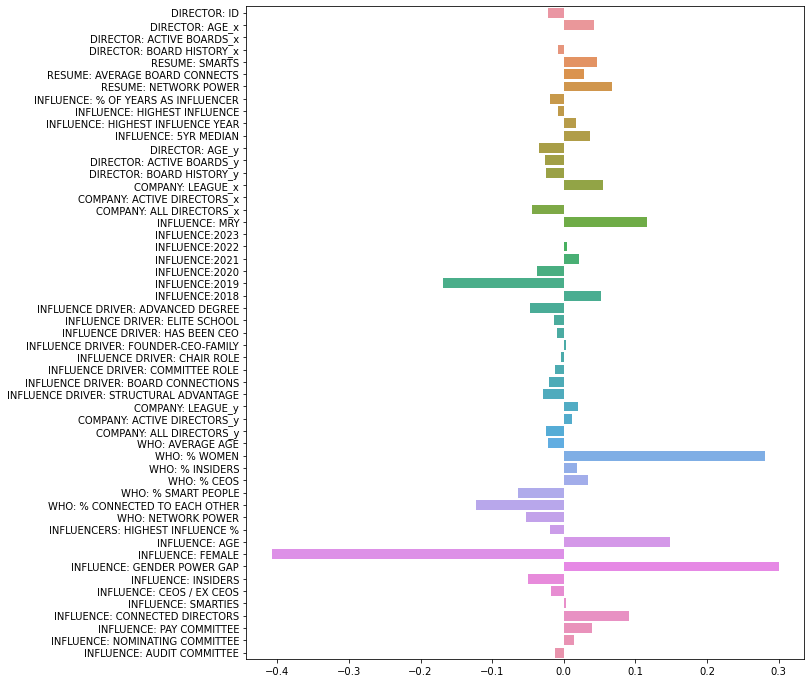

In [272]:
plt.figure(figsize=(10, 12))
sns.barplot(y=X.columns, x = lasso_best.coef_)

In [294]:
# summarize the result of lasso regression with the text
print("Lasso Regression coeffecients: " ,lasso_best.coef_)
print("Lasso Regression intercepts: ", lasso_best.intercept_)
print("Lasso Regression score: " ,lasso_best.score(X_test, y_test))


Lasso Regression coeffecients:  [-2.16014943e-02  4.22371048e-02 -0.00000000e+00 -7.61509901e-03
  4.58478084e-02  2.87901180e-02  6.71332994e-02 -1.95657484e-02
 -8.21693100e-03  1.66205992e-02  3.70417967e-02 -3.43713926e-02
 -2.68844432e-02 -2.51373697e-02  5.45752898e-02  8.65605753e-07
 -4.41586073e-02  1.16690726e-01  2.26554849e-17  4.16668449e-03
  2.17484335e-02 -3.71179286e-02 -1.68474504e-01  5.19251476e-02
 -4.78382230e-02 -1.34116872e-02 -9.97043566e-03  3.00206639e-03
 -3.46768434e-03 -1.16439894e-02 -2.05525470e-02 -2.94368490e-02
  2.04555439e-02  1.19893437e-02 -2.42276382e-02 -2.13799519e-02
  2.80446297e-01  1.78346997e-02  3.32506799e-02 -6.38887112e-02
 -1.22047517e-01 -5.21584903e-02 -1.97327385e-02  1.47763909e-01
 -4.07997914e-01  3.00261001e-01 -5.05701056e-02 -1.82297445e-02
  2.60146940e-03  9.12755449e-02  3.97180885e-02  1.38771146e-02
 -1.26853461e-02]
Lasso Regression intercepts:  0.007574126659098436
Lasso Regression score:  0.03125076791208925


In [273]:
# choose the features whose absolute coefficient is bigger than 0.005
X_train_lasso = X_train.loc[:, abs(lasso_best.coef_) > 0.005]
X_test_lasso = X_test.loc[:, abs(lasso_best.coef_) > 0.005]

# fit linear regression model
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train_lasso, y_train)

# predict y
y_pred = lr.predict(X_test_lasso)

# calculate the R^2

r2_score(y_test, y_pred)

0.03142381085411261

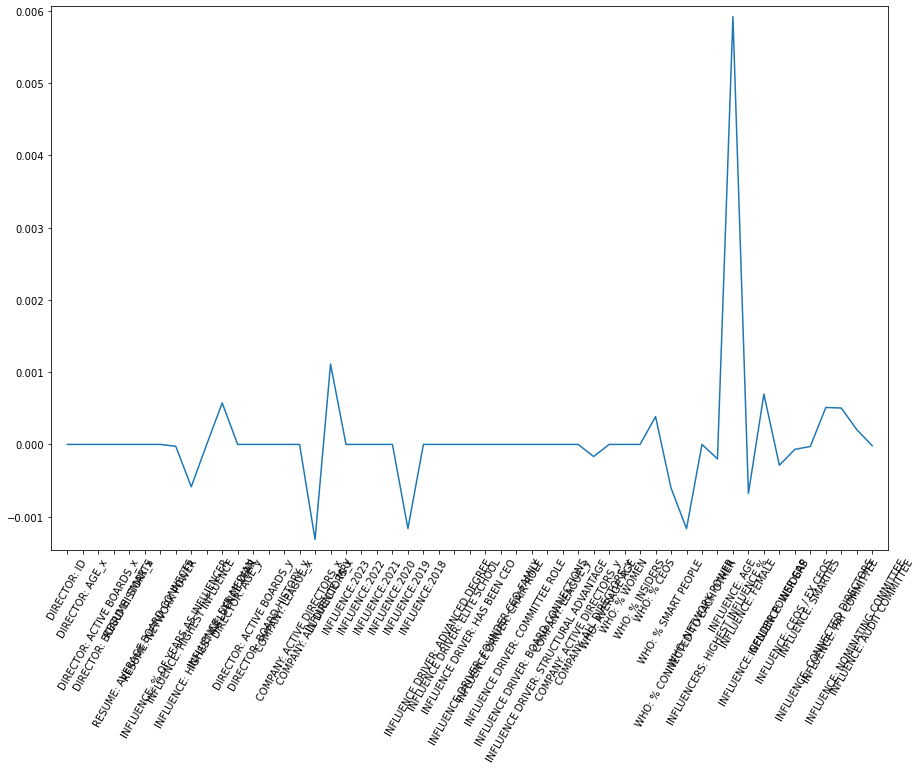

In [248]:
# visualize the result of lasso regression
# plt.figure(figsize=(15, 10))
# plt.plot(range(len(X.columns)), lasso.coef_)
# plt.xticks(range(len(X.columns)), X.columns.values, rotation=60)
# plt.margins(0.02)
# plt.show()



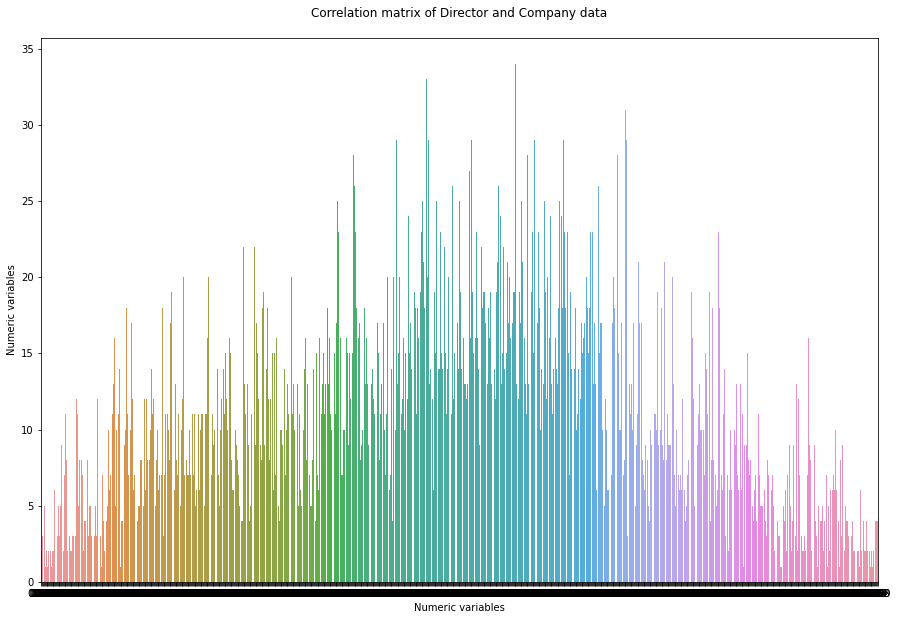

In [ ]:

# visualize df_drct_dc_com_corr1 with PERFORMACE: EBITDA WIN RATE
# fig, ax = plt.subplots(figsize=(15, 10))


# corrplot = sns.countplot(data = df_drct_dc_com_numeric, x='PERFORMANCE: EBITDA WIN RATE_x', ax=ax)
# # cmap=sns.diverging_palette(20, 220, n=800), annot=True)

# corrplot.set(xlabel='Numeric variables', ylabel='Numeric variables', title = "Correlation matrix of Director and Company data\n")

# plt.show()



(1.1126923463507298e-06,
 0.002220113106827915,
 0.8786886560872421,
 1.0691864150140873)

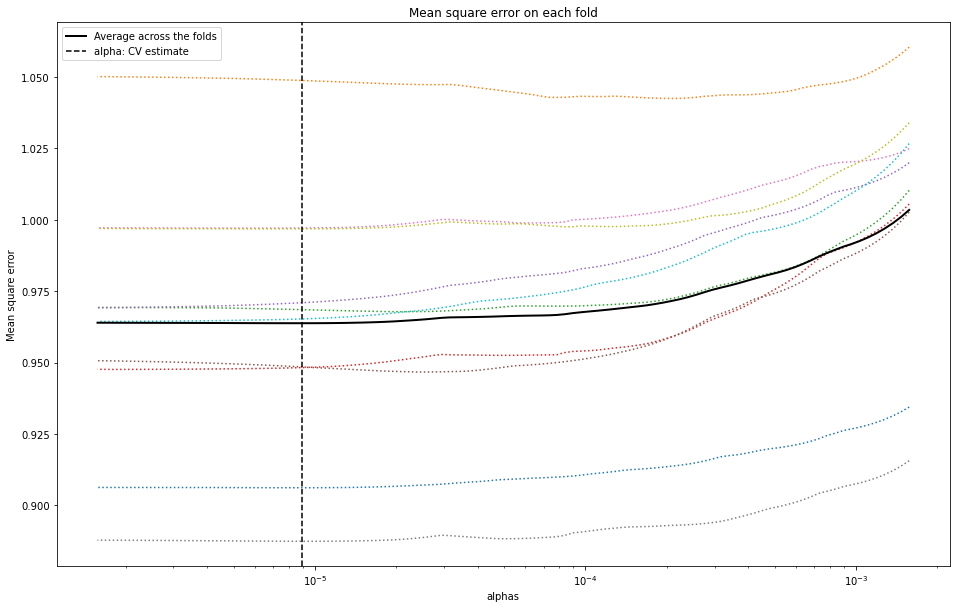

In [276]:
# 
fig, ax = plt.subplots(figsize=(16, 10))
plt.semilogx(lassocv.alphas_, lassocv.mse_path_, ":")
plt.plot(
    lassocv.alphas_ ,
    lassocv.mse_path_.mean(axis=-1),
    "k",
    label="Average across the folds",
    linewidth=2,
)
plt.axvline(
    lassocv.alpha_, linestyle="--", color="k", label="alpha: CV estimate"
)

plt.legend()
plt.xlabel("alphas")
plt.ylabel("Mean square error")
plt.title("Mean square error on each fold")
plt.axis("tight")

## Xgboost

In [ ]:
!pip install xgboost

In [56]:
X.columns

Index(['DIRECTOR: AGE_x', 'DIRECTOR: ACTIVE BOARDS_x',
       'DIRECTOR: BOARD HISTORY_x', 'RESUME: SMARTS',
       'RESUME: AVERAGE BOARD CONNECTS', 'RESUME: NETWORK POWER',
       'INFLUENCE: % OF YEARS AS INFLUENCER', 'INFLUENCE: HIGHEST INFLUENCE',
       'INFLUENCE: HIGHEST INFLUENCE YEAR', 'INFLUENCE: 5YR MEDIAN',
       'DIRECTOR: AGE_y', 'DIRECTOR: ACTIVE BOARDS_y',
       'DIRECTOR: BOARD HISTORY_y', 'COMPANY: LEAGUE_x',
       'COMPANY: ACTIVE DIRECTORS_x', 'COMPANY: ALL DIRECTORS_x',
       'INFLUENCE DRIVER: ADVANCED DEGREE', 'INFLUENCE DRIVER: ELITE SCHOOL',
       'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRIVER: FOUNDER-CEO-FAMILY', 'INFLUENCE DRIVER: CHAIR ROLE',
       'INFLUENCE DRIVER: COMMITTEE ROLE',
       'INFLUENCE DRIVER: BOARD CONNECTIONS',
       'INFLUENCE DRIVER: STRUCTURAL ADVANTAGE', 'COMPANY: LEAGUE_y',
       'COMPANY: ACTIVE DIRECTORS_y', 'COMPANY: ALL DIRECTORS_y',
       'WHO: AVERAGE AGE', 'WHO: % WOMEN', 'WHO: % INSIDERS', 'WHO: % CEOS',


In [141]:
# use xgboost to fit the model
# Also use GridSearchCV to find the best parameters
import xgboost as xgb

from sklearn.model_selection import GridSearchCV

xgb_model = xgb.XGBRegressor()

parameters = {
    "objective": ["reg:squarederror"],
    "learning_rate": [ 0.1, 0.2],
    "max_depth": [5, 7],
    "min_child_weight": [1, 3, 5],
    "gamma": [0.0, 0.1],
    # "colsample_bytree": [0.3, 0.4, 0.5, 0.7],
    "n_estimators": [100, 300, 500],
}

xgb_grid = GridSearchCV(xgb_model, parameters, cv=5, n_jobs=-1, verbose=True)


In [142]:

xgb_grid.fit(X_train, y_train)

# predict y
y_pred = xgb_grid.predict(X_test)

# calculate the R^2
r2_score(y_test, y_pred)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


0.7385114114637674

In [145]:
print("The best hyperparameters are ",xgb_grid.best_params_)

The best hyperparameters are  {'gamma': 0.0, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror'}


In [143]:
regressor=xgb.XGBRegressor(learning_rate = xgb_grid.best_params_["learning_rate"],
                           n_estimators  = xgb_grid.best_params_["n_estimators"],
                           max_depth     = xgb_grid.best_params_["max_depth"],
                           gamma         = xgb_grid.best_params_["gamma"],
                            min_child_weight = xgb_grid.best_params_["min_child_weight"],
                            objective     = 'reg:squarederror',
                           eval_metric='rmsle')

regressor.fit(X_train, y_train)
predictions = regressor.predict(X_test)

In [144]:
r2_score(y_test, y_pred)

0.7385114114637674

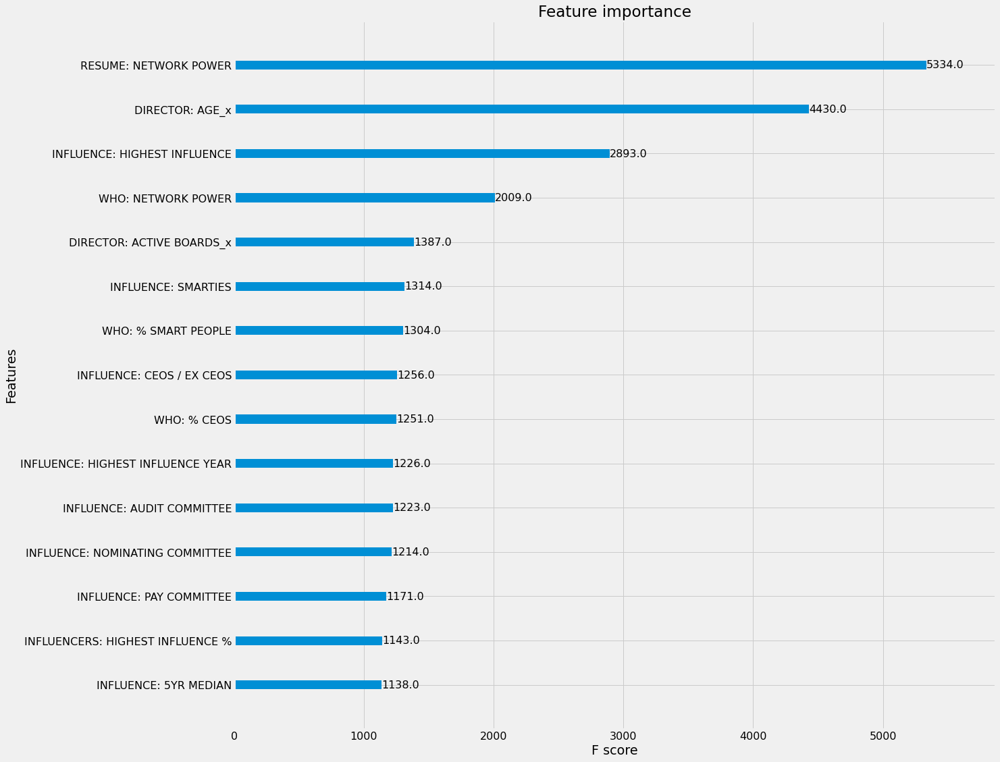

In [146]:
from xgboost import plot_importance

plt.style.use('fivethirtyeight')
plt.rcParams.update({'font.size': 16})

fig, ax = plt.subplots(figsize=(18,18))
plot_importance(regressor, max_num_features=15, ax=ax)
plt.show();

XGBoost score:  0.7385114114637674


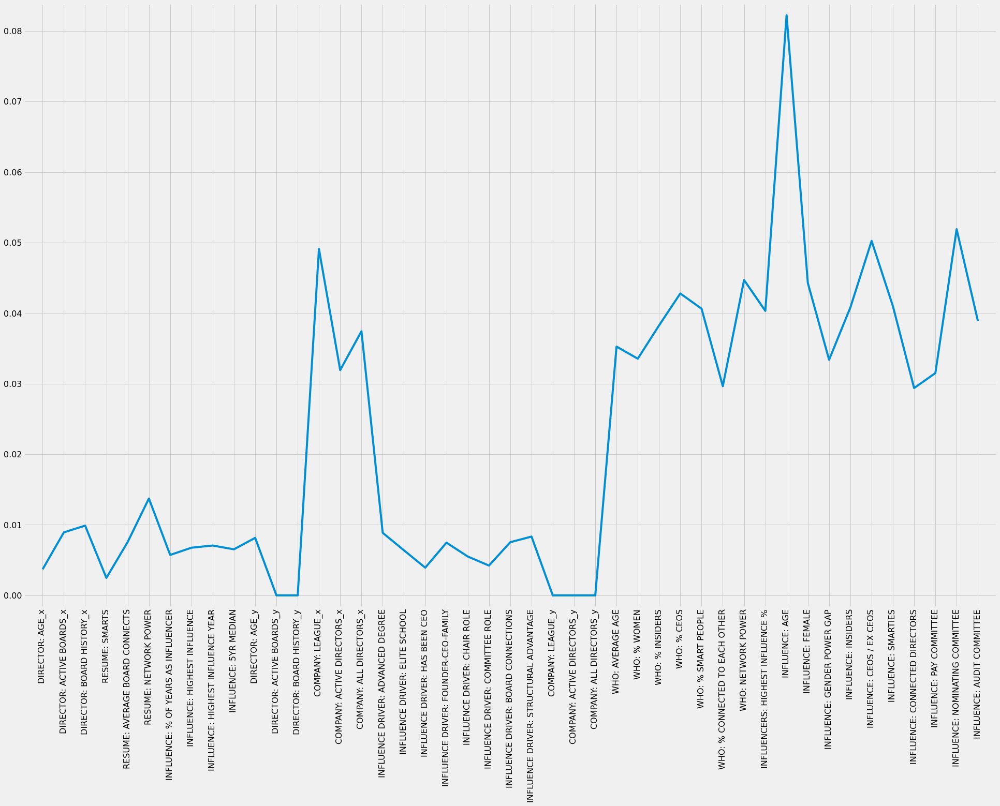

In [147]:
# view the result of xgboost
print("XGBoost score: ", regressor.score(X_test, y_test))

# visualize the result of xgboost
plt.figure(figsize=(30, 20))
plt.plot(range(len(X.columns)), regressor.feature_importances_)
plt.xticks(range(len(X.columns)), X.columns.values, rotation=90)
plt.margins(0.02)
plt.show()



In [148]:
# combine the feature importance with the feature name
feature_importance = pd.DataFrame(
    {"feature": X.columns, "importance": regressor.feature_importances_}
)
print(feature_importance)

                                   feature  importance
0                          DIRECTOR: AGE_x    0.003696
1                DIRECTOR: ACTIVE BOARDS_x    0.008935
2                DIRECTOR: BOARD HISTORY_x    0.009883
3                           RESUME: SMARTS    0.002479
4           RESUME: AVERAGE BOARD CONNECTS    0.007556
5                    RESUME: NETWORK POWER    0.013730
6      INFLUENCE: % OF YEARS AS INFLUENCER    0.005731
7             INFLUENCE: HIGHEST INFLUENCE    0.006755
8        INFLUENCE: HIGHEST INFLUENCE YEAR    0.007064
9                    INFLUENCE: 5YR MEDIAN    0.006529
10                         DIRECTOR: AGE_y    0.008152
11               DIRECTOR: ACTIVE BOARDS_y    0.000000
12               DIRECTOR: BOARD HISTORY_y    0.000000
13                       COMPANY: LEAGUE_x    0.049084
14             COMPANY: ACTIVE DIRECTORS_x    0.031929
15                COMPANY: ALL DIRECTORS_x    0.037435
16       INFLUENCE DRIVER: ADVANCED DEGREE    0.008863
17        

## Third Table

In [103]:


DF = df_dc.drop(['DIRECTOR: NAME','COMPANY: NAME','COMPANY: TICKER','DIRECTOR: ID', 'DIRECTOR: DIVERSITY','COMPANY: CUSIP','COMPANY: DOMICILE','COMPANY: SECTOR','INFLUENCE:2023',
                'INFLUENCE:2022','INFLUENCE:2021','INFLUENCE:2020','INFLUENCE:2019','INFLUENCE:2018','PERFORMANCE: WIN RATE',
                'PERFORMANCE: TSR WIN RATE','PERFORMANCE: CARBON INTENSITY WIN RATE','PERFORMANCE: CONTROVERSY WIN RATE'], axis=1)

DF['PERFORMANCE: EBITDA WIN RATE'] = DF['PERFORMANCE: EBITDA WIN RATE'].replace('Unrated', np.nan)
DF = DF.dropna()
DF['PERFORMANCE: EBITDA WIN RATE'] = DF['PERFORMANCE: EBITDA WIN RATE'].astype(float)


In [77]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44584 entries, 1 to 86771
Data columns (total 17 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   DIRECTOR: AGE                           44584 non-null  float64
 1   DIRECTOR: GENDER                        44584 non-null  object 
 2   DIRECTOR: ACTIVE BOARDS                 44584 non-null  int64  
 3   DIRECTOR: BOARD HISTORY                 44584 non-null  int64  
 4   COMPANY: LEAGUE                         44584 non-null  int64  
 5   COMPANY: ACTIVE DIRECTORS               44584 non-null  int64  
 6   COMPANY: ALL DIRECTORS                  44584 non-null  int64  
 7   INFLUENCE: MRY                          44584 non-null  float64
 8   INFLUENCE DRIVER: ADVANCED DEGREE       44584 non-null  int64  
 9   INFLUENCE DRIVER: ELITE SCHOOL          44584 non-null  int64  
 10  INFLUENCE DRIVER: HAS BEEN CEO          44584 non-null  in

In [104]:
DF.iloc[:, 8:16] = DF.iloc[:, 8:16].replace({'Yes': 1, 'No': 0})

DF.iloc[:, 1] = DF.iloc[:, 1].replace({'Male': 1, 'Female': 0, 'Not Stated': np.nan})

In [105]:
DF = DF.dropna()

In [106]:
DF['DIRECTOR: GENDER'].unique()

array([0., 1.])

In [107]:
DF['DIRECTOR: GENDER'] = DF['DIRECTOR: GENDER'].astype(int)

In [ ]:
print(DF.head())

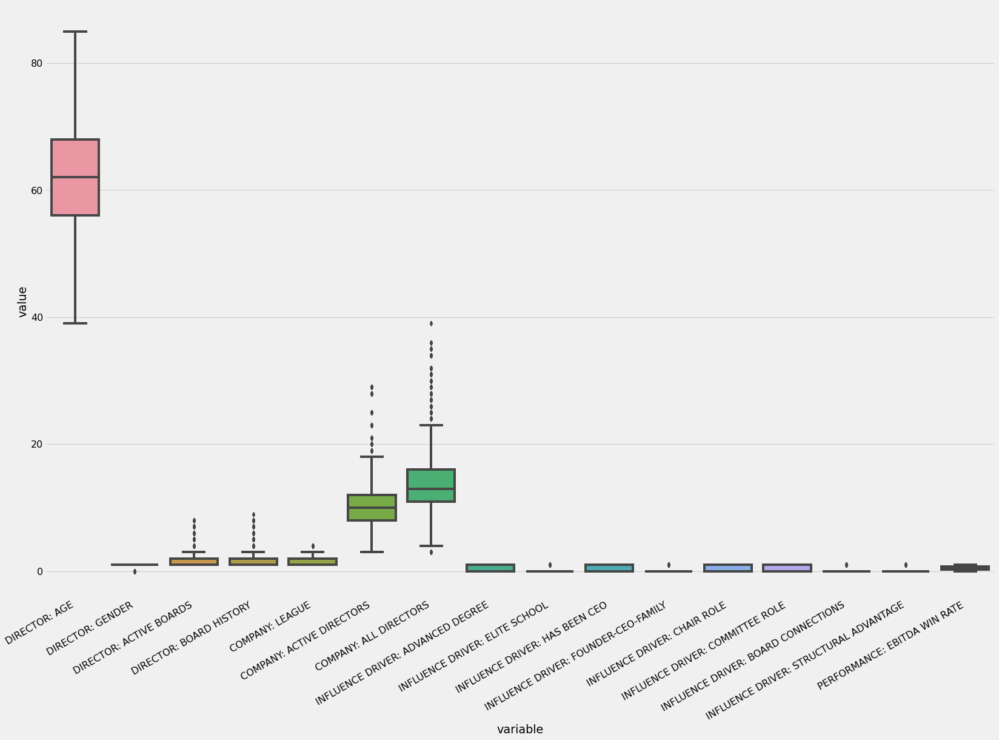

In [90]:


# visualize the outliers of df_drct_dc_com_numeric
# Select numeric variables to compute correlation


fig = plt.figure(figsize=(25,20))

sns.boxplot(x="variable", y="value", data=pd.melt(DF))
plt.gcf().autofmt_xdate()
plt.show()

In [108]:
outlier_col = ['DIRECTOR: AGE']
for col in outlier_col:
    Q1 = DF[col].quantile(0.25)
    Q3 = DF[col].quantile(0.75)
    IQR = Q3 - Q1
  
    DF.drop(DF[DF[col] >= (Q3+1.5*IQR)].index, axis=0, inplace = True)
    DF.drop(DF[DF[col] <= (Q1-1.5*IQR)].index, axis=0, inplace = True)

DF.reset_index(drop=True, inplace=True)

In [113]:
# Standardize all the variables for DF dataset
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
DF_std = scaler.fit_transform(DF)

DF_std = pd.DataFrame(DF_std, columns=DF.columns)

DF_std.head()




   DIRECTOR: AGE  DIRECTOR: GENDER  DIRECTOR: ACTIVE BOARDS  \
0       0.713476         -1.901233                -0.588187   
1      -0.087389          0.525974                -0.588187   
2       1.514341          0.525974                -0.588187   
3       1.857569          0.525974                -0.588187   
4       1.056704          0.525974                 0.573042   

   DIRECTOR: BOARD HISTORY  COMPANY: LEAGUE  COMPANY: ACTIVE DIRECTORS  \
0                -0.622417        -1.081215                    0.24749   
1                -0.622417        -1.081215                    0.24749   
2                 0.341460        -1.081215                    0.24749   
3                -0.622417        -1.081215                    0.24749   
4                 2.269214        -1.081215                    0.24749   

   COMPANY: ALL DIRECTORS  INFLUENCE DRIVER: ADVANCED DEGREE  \
0               -0.134467                           1.036083   
1               -0.134467                       

In [109]:
# drop the columns of df_drct_dc_com whose name in columns_PERFORMANCE
DF_std = DF_std.drop(columns=['INFLUENCE: MRY'])
print(DF_std.columns)

Index(['DIRECTOR: AGE', 'DIRECTOR: GENDER', 'DIRECTOR: ACTIVE BOARDS',
       'DIRECTOR: BOARD HISTORY', 'COMPANY: LEAGUE',
       'COMPANY: ACTIVE DIRECTORS', 'COMPANY: ALL DIRECTORS',
       'INFLUENCE DRIVER: ADVANCED DEGREE', 'INFLUENCE DRIVER: ELITE SCHOOL',
       'INFLUENCE DRIVER: HAS BEEN CEO',
       'INFLUENCE DRIVER: FOUNDER-CEO-FAMILY', 'INFLUENCE DRIVER: CHAIR ROLE',
       'INFLUENCE DRIVER: COMMITTEE ROLE',
       'INFLUENCE DRIVER: BOARD CONNECTIONS',
       'INFLUENCE DRIVER: STRUCTURAL ADVANTAGE',
       'PERFORMANCE: EBITDA WIN RATE'],
      dtype='object')


In [91]:
# Split the dataset into training and testing sets
X = DF_std.drop(columns=['PERFORMANCE: EBITDA WIN RATE'])
y = DF_std['PERFORMANCE: EBITDA WIN RATE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# use xgboost to fit the model
# Also use GridSearchCV to find the best parameters
import xgboost as xgb

from sklearn.model_selection import GridSearchCV

xgb_model = xgb.XGBRegressor()

parameters = {
    "objective": ["reg:squarederror"],
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7],
    "min_child_weight": [1, 3, 5],
    "gamma": [0.0, 0.1, 0.2],
    # "colsample_bytree": [0.3, 0.4, 0.5, 0.7],
    "n_estimators": [100, 300, 500],
}

xgb_grid = GridSearchCV(xgb_model, parameters, cv=5, n_jobs=-1, verbose=True)



In [92]:
# Show the best parameters
xgb_grid.fit(X_train, y_train)

# predict y
y_pred = xgb_grid.predict(X_test)


Fitting 5 folds for each of 243 candidates, totalling 1215 fits
The best hyperparameters are  {'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror'}


In [93]:


print("The best hyperparameters are ",xgb_grid.best_params_)

The best hyperparameters are  {'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 500, 'objective': 'reg:squarederror'}


In [118]:
# use the best parameters to fit the model
regressor=xgb.XGBRegressor(learning_rate = xgb_grid.best_params_["learning_rate"],
                            n_estimators  = xgb_grid.best_params_["n_estimators"],
                            max_depth     = xgb_grid.best_params_["max_depth"],
                            gamma         = xgb_grid.best_params_["gamma"],
                            min_child_weight = xgb_grid.best_params_["min_child_weight"],
                            objective     = 'reg:squarederror',
                            eval_metric='rmsle')

regressor.fit(X_train, y_train)
predictions = regressor.predict(X_test)


In [119]:
# r squared
print("XGBoost score: ", regressor.score(X_test, y_test))

XGBoost score:  0.06183592810183469


In [120]:

# calculate the R^2
r2_score(y_test, y_pred)

0.0067915530284334835

In [96]:

from xgboost import plot_importance

plt.style.use('fivethirtyeight')
plt.rcParams.update({'font.size': 16})


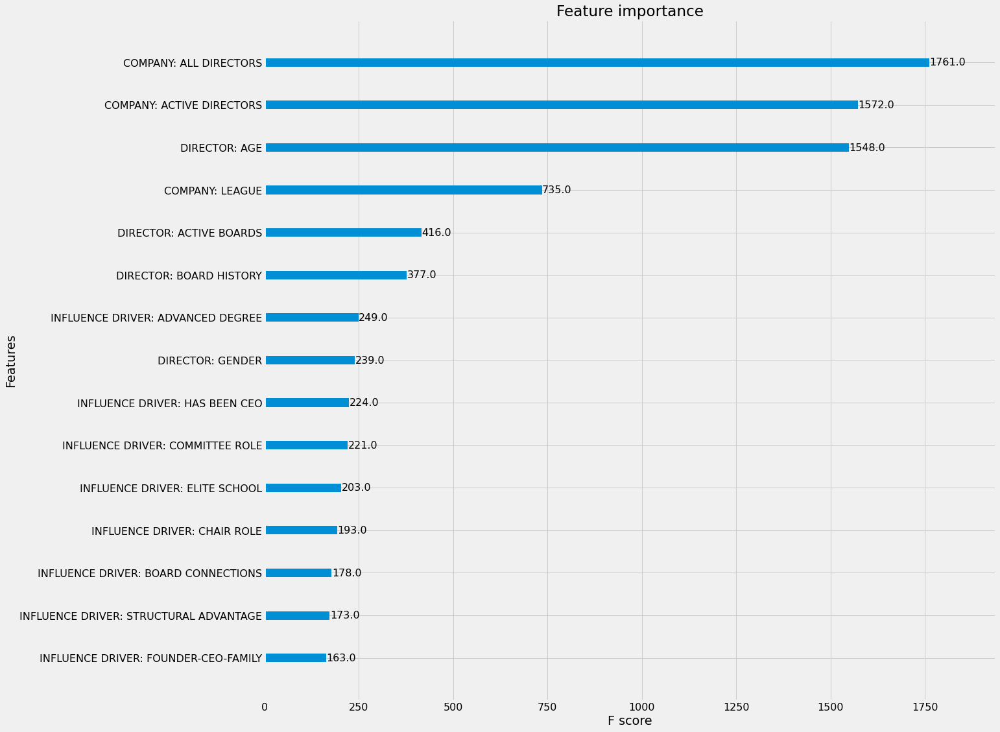

XGBoost score:  0.06618150416184165


In [97]:

fig, ax = plt.subplots(figsize=(18,18))
plot_importance(regressor, max_num_features=15, ax=ax)
plt.show();

# view the result of xgboost
print("XGBoost score: ", regressor.score(X_test, y_test))


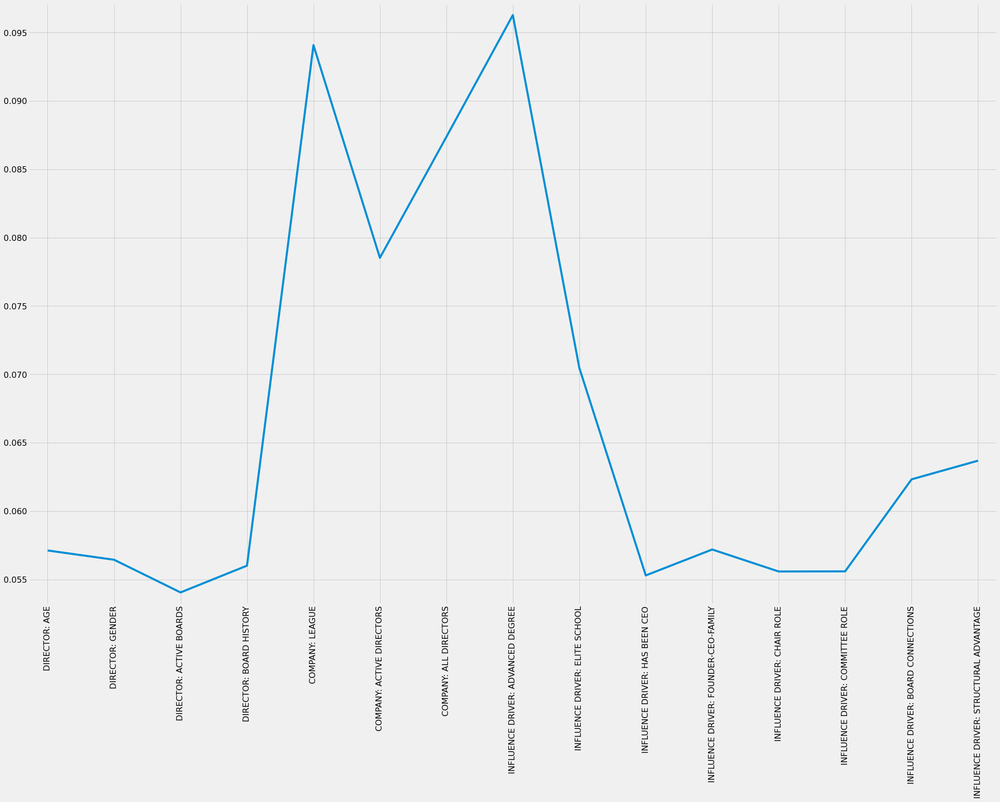

In [98]:

# visualize the result of xgboost
plt.figure(figsize=(30, 20))
plt.plot(range(len(X.columns)), regressor.feature_importances_)

plt.xticks(range(len(X.columns)), X.columns.values, rotation=90)
plt.margins(0.02)
plt.show()



Coefficients: 
 [ 0.0005816  -0.00338903  0.00416898 -0.01493468  0.01580054  0.00280935
 -0.00835464  0.00802517 -0.01684828 -0.00657042 -0.0064994  -0.00539818
 -0.00576712  0.01189876  0.01185556]
Mean squared error: 0.07
Coefficient of determination: 0.01


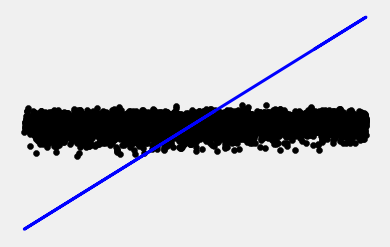

In [99]:
# linear regression model to predict the performance of EBITDA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

reg = LinearRegression().fit(X_train, y_train)
y_pred = reg.predict(X_test)

# The coefficients
print('Coefficients: \n', reg.coef_)
# The mean squared error
print('Mean squared error: %.2f'
        % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'
        % r2_score(y_test, y_pred)) 

# Plot outputs
plt.scatter(y_test, y_pred,  color='black')
plt.plot(y_test, y_test, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())
plt.show()



In [114]:
# take the log of the performance of EBITDA
DF_log = DF_std.copy()
DF_log['PERFORMANCE: EBITDA WIN RATE'] = np.log(DF_log['PERFORMANCE: EBITDA WIN RATE'])

# remove the NaN, infinity or a value too large for dtype('float64').
DF_log = DF_log.replace([np.inf, -np.inf], np.nan)
DF_log = DF_log.dropna()



# Split the dataset into training and testing sets
X = DF_log.drop(columns=['PERFORMANCE: EBITDA WIN RATE'])
y = DF_log['PERFORMANCE: EBITDA WIN RATE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


Coefficients: 
 [-0.01946658  0.02627338  0.01076687 -0.01137883  0.05907971 -0.07297494
 -0.03376185  0.0080914  -0.02554552 -0.01791966 -0.01646632 -0.00651417
 -0.00374427 -0.00098559  0.02373913]
Mean squared error: 1.10
Coefficient of determination: 0.01


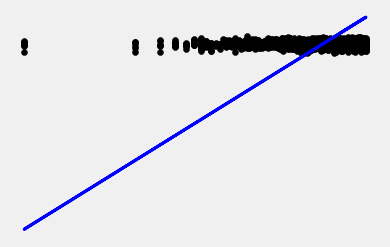

In [115]:
# linear regression model to predict the performance of EBITDA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

reg = LinearRegression().fit(X_train, y_train)
y_pred = reg.predict(X_test)

# The coefficients
print('Coefficients: \n', reg.coef_)
# The mean squared error
print('Mean squared error: %.2f'

        % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'

        % r2_score(y_test, y_pred))

# Plot outputs
plt.scatter(y_test, y_pred,  color='black')
plt.plot(y_test, y_test, color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())
plt.show()
